In [120]:
import os
from multiprocessing import Pool
from functools import partial

import librosa
import librosa.display
import matplotlib.pyplot as plt
from pydub import AudioSegment
import numpy as np

import argparse
from time import time
from IPython.display import Audio

import torch

import sox

In [2]:
test_audio_mp3_src = "/home/pasinducw/Downloads/Research-Datasets/Sinhala-Songs/files/index/3.mp3"

In [16]:
last_tick_time = None
def tick():
    global last_tick_time
    last_tick_time = time()
    
def tock(message = "since last tick"):
    global last_tick_time
    now = time()
    if last_tick_time:
        print("{}s {}".format(now-last_tick_time, message))
    last_tick_time = now

In [53]:
tick()
AudioSegment.from_mp3(test_audio_mp3_src).export("./3.wav", format="wav")
tock("to convert mp3 to wav")

0.5923120975494385s to convert mp3 to wav


In [57]:
tick()
waveform, sr = librosa.load("./3.wav", offset=10, duration=40)
tock("to load wav with librosa")
print(waveform.shape)
Audio(waveform, rate=sr)

1.1497328281402588s to load wav with librosa
(882000,)


In [58]:
# Pitch transform
tick()
transformed = librosa.effects.pitch_shift(waveform, sr, n_steps=1, bins_per_octave = 24)
tock("to transform one semitone up")
Audio(transformed, rate=sr)

0.9321789741516113s to transform one semitone up


In [59]:
tick()
transformed = librosa.effects.pitch_shift(waveform, sr, n_steps=5)
tock("to transform five semitones up")
Audio(transformed, rate=sr)

1.1069936752319336s to transform five semitones up


In [46]:
tick()
transformed = librosa.effects.pitch_shift(waveform, sr, n_steps=-5)
tock("to transform five semitone down")

0.7779102325439453s to transform five semitone down


In [61]:
tick()
tempo = librosa.beat.tempo(waveform, sr)
tock("to estimate the tempo")
print(tempo)

0.18746614456176758s to estimate the tempo
[89.10290948]


In [63]:
tick()
fast_waveform = librosa.effects.time_stretch(waveform, 1.1)
tock("to timestretch the waveform")
print(waveform.shape, fast_waveform.shape)
Audio(fast_waveform, rate=sr)

0.2821319103240967s to timestretch the waveform
(882000,) (801818,)


In [65]:
def apply_noise(waveform):
    noise_amplitude = 0.005 * np.random.uniform() * np.amax(waveform)
    waveform = waveform.copy()
    waveform = waveform.astype('float64') + noise_amplitude * np.random.normal(size=waveform.shape[0])
    return waveform
tick()
noised_waveform = apply_noise(waveform)
tock("to apply noise")
Audio(noised_waveform, rate=sr)

0.027487993240356445s to apply noise


In [70]:
# Aud Aug IO
chain = audaugio.CombinatoricChain(
    audaugio.PitchShiftAugmentation(1),
    audaugio.BackgroundNoiseAugmentation(0.005),
    audaugio.EqualizerAugmentation(800, 0.15, -15)
)
augmented_waveforms = chain(waveform, sr)

AttributeError: module 'librosa' has no attribute 'output'

In [85]:
np.random.random(size=4)*10-5

array([ 1.58488238,  3.95945534, -2.61592586, -2.60461198])

In [90]:
def main():
    args = parser.parse_args()
    with Pool(int(args.workers)) as p:
        func = partial(
            process_audio,
            args.source,
            int(args.sample_rate),
            int(args.offset),
            int(args.duration),
            args.destination
        )
        p.map(func, range(int(args.start_id), int(args.end_id)))


def normalize(waveform):
    mx = np.maximum(np.amax(waveform), -np.amin(waveform))
    return waveform / (mx * 1.0)


def mfcc(waveform, plot=False):
    mfccs = librosa.feature.mfcc(
        y=waveform, sr=16000, n_mfcc=13, n_fft=400, hop_length=160)

    if plot:
        plt.figure()
        librosa.display.specshow(mfccs, x_axis="time")
        plt.colorbar()
        plt.title("MFCC")
        plt.tight_layout()
    return mfccs


def is_feature_calculated(file_id, transformation_id, save_directory):
    file_name = "{}-{}.npy".format(file_id, transformation_id)
    if os.path.exists(os.path.join(save_directory, file_name)):
        return True
    return False


def write_features(file_id, features, feature_params, save_directory):
    file_name = "{}.npy".format(file_id)
    with open(os.path.join(save_directory, file_name), "wb") as file:
        np.save(file, (features, feature_params))


def apply_pitch_transform(waveform, sr, steps):
    return librosa.effects.pitch_shift(waveform, sr, n_steps=steps, bins_per_octave=12)


def apply_speed_transform(waveform, multiplier):
    return librosa.effects.time_stretch(waveform, multiplier)


def apply_noise(waveform):
    noise_amplitude = 0.005 * np.random.uniform() * np.amax(waveform)
    waveform = waveform.copy()
    waveform = waveform.astype(
        'float64') + noise_amplitude * np.random.normal(size=waveform.shape[0])
    return waveform


def process_audio(
        source_directory,
        save_directory,
        audio_sample_rate,
        audio_offset,
        audio_duration,
        audio_id,
):
    original = os.path.join(source_directory, "{}.mp3".format(audio_id))
    converted = "converted.{}.wav".format(audio_id)

    if os.path.exists(original):
        # Check if all the transformations are there, if so skip the complete section
        completed = True
        for transform_id in range(5):
            if not is_feature_calculated(audio_id, transform_id, save_directory):
                completed = False
                print("Audio {} with transform {} is not there".format(
                    audio_id, transform_id))
                break

        if completed:
            print("Audio {} already pre-processed and saved".format(audio_id))
            return
        else:
            print("Processing Audio {}".format(audio_id))

        AudioSegment.from_mp3(original).export(converted, format="wav")
        waveform, sr = librosa.load(
            converted, offset=audio_offset, duration=audio_duration, sr=audio_sample_rate)
        os.remove(converted)

        audio_feature_params = []
        audio_features = []

        # original
        audio_feature_params.append("original")
        audio_features.append(mfcc(normalize(waveform)))

        # noise
        audio_feature_params.append("noised")
        audio_features.append(mfcc(normalize(apply_noise(waveform))))

        # pitch transformations
        for steps in (np.random.random(size=5) * 10 - 5):
            audio_feature_params.append("pitch:{}".format(steps))
            audio_features.append(
                mfcc(normalize(apply_pitch_transform(waveform, sr, steps))))

        # speed transforms
        for multiplier in (np.random.random(size=5) * 1.4):
            audio_feature_params.append("speed:{}".format(multiplier))
            audio_features.append(
                mfcc(normalize(apply_speed_transform(waveform, multiplier))))

        write_features(audio_id, audio_features,
                       audio_feature_params, save_directory)
        print("Preprocessed {}".format(audio_id))
    else:
        print("Audio file with id {} does not exist".format(audio_id))


In [91]:
process_audio("/home/pasinducw/Downloads/Research-Datasets/Sinhala-Songs/files/index/", "./", 16000, 5, 90, 3)

Audio 3 with transform 0 is not there
Processing Audio 3
Preprocessed 3


In [148]:
def draw_mfccs(*mfccs):
    plots = len(mfccs)

    plt.figure()
    for i, mfcc in enumerate(mfccs):
        plt.subplot(1, plots, i+1)
        librosa.display.specshow(mfcc, x_axis="time")
        plt.colorbar()
        plt.title("MFCC")
        plt.tight_layout()

In [121]:
params, features = np.load("/home/pasinducw/Downloads/Research-Datasets/Sinhala-Songs/features/1.npy", allow_pickle=True)
print(features[9].shape)
print(params.shape)



(13, 9330)
(10,)


In [150]:
import os
import math
import torch
import numpy as np


class SinhalaSongsDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, trim_seconds=10, test=False, validation=False):
        self.dir = root_dir
        self.feature_list = sorted(os.listdir(self.dir))
        self.trim_seconds = trim_seconds

        length = len(self.feature_list)
        block_1 = math.floor((length/5.0) * 0.6) * 5  # 60% of originals
        block_2 = math.floor((length/5.0) * 0.8) * 5  # 80% of originals

        start_index = 0
        end_index = block_1

        if test == True:
            start_index = block_1
            end_index = block_2
        if validation == True:
            start_index = block_2
            end_index = length

        self.feature_list = self.feature_list[start_index:end_index]

    def __len__(self):
        return len(self.feature_list)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        song_id = self.feature_list[idx].split(".")[0]

        song_path = os.path.join(self.dir, self.feature_list[idx])
        _, features = np.load(song_path, allow_pickle=True)
        # mfccs = torch.from_numpy(np.load(song_path))

        trim_frames = self.trim_seconds * 100
        # mfccs = mfccs[:, :trim_frames]  # trim song to given number of seconds

        all_mfccs = []

        for mfccs in features:
            # trim song to given number of seconds
            mfccs = torch.from_numpy(mfccs[:, :trim_frames])

            # converting to shape [M_number_of_mfcc_coefficients, I_MFCC_blocks, T_number_of_steps]
            mfccs = mfccs.view(13, -1, 100)
            # converting to shape [I_MFCC_blocks, T_number_of_steps, M_number_of_mfcc_coefficients]
            mfccs = mfccs.permute(1, 2, 0)
            all_mfccs.append(mfccs)

        return int(song_id), torch.cat(all_mfccs)


0
tensor([1])
torch.Size([1, 100, 100, 13])
1
tensor([10])
torch.Size([1, 100, 100, 13])
2
tensor([11])
torch.Size([1, 100, 100, 13])
3
tensor([2])
torch.Size([1, 100, 100, 13])
4
tensor([3])
torch.Size([1, 100, 100, 13])


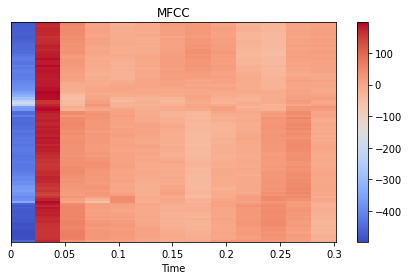

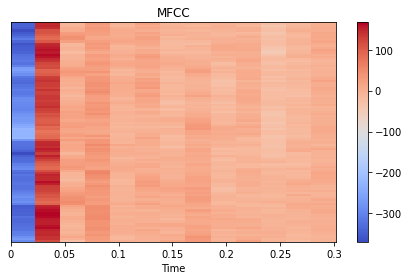

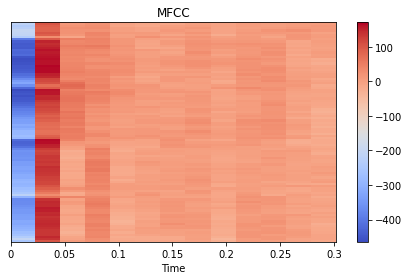

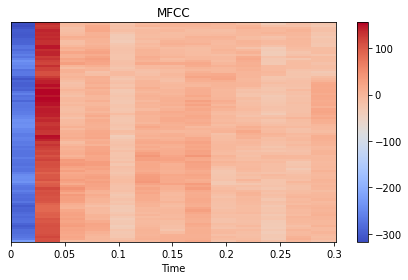

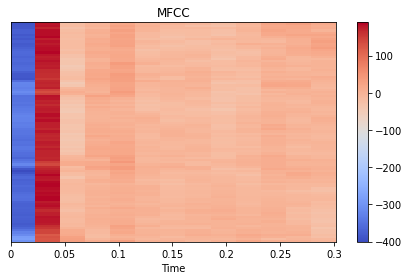

In [151]:
dataset = SinhalaSongsDataset("/home/pasinducw/Downloads/Research-Datasets/Sinhala-Songs/features")
dataloader = torch.utils.data.DataLoader(dataset)

for i, (song_ids, mfccs) in enumerate(dataloader):
    print(i)
    print(song_ids)
    print(mfccs.shape)
    draw_mfccs(mfccs[0,0].numpy())